In [179]:
from flask import Flask, request, redirect, url_for,send_from_directory, render_template_string
from werkzeug.utils import secure_filename
import caffe
import json
import numpy as np
import os
from sklearn import svm,metrics
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import struct
import pandas as pd
from __future__ import division
import collections

In [2]:
deployPrototxt = "/opt/swm-ml-docker/swm-ml-master/bvlc_reference_caffenet/deploy.prototxt"
caffeModel = "/opt/swm-ml-docker/swm-ml-master/bvlc_reference_caffenet/bvlc_reference_caffenet.caffemodel"
featureVectorDirectory = "/opt/swm-ml-docker/data/train"
metadataDirectory = '/opt/swm-ml-docker/metadata_bak/'
imageMeanFile = '/opt/swm-ml-docker/ilsvrc_2012_mean.npy'
layerName = 'fc7'

In [3]:
print("Loading model ...")
cnn = caffe.Net(deployPrototxt, caffe.TEST, weights=caffeModel)
print("Done loading")

Loading model ...
Done loading


In [4]:
# reshape to accept one image at a time.
(_, c, w, h) = cnn.blobs['data'].data.shape
cnn.blobs['data'].reshape(1, c, w, h)
transformer = caffe.io.Transformer({'data': cnn.blobs['data'].data.shape})
transformer.set_mean('data', np.load(imageMeanFile).mean(1).mean(1))
transformer.set_transpose('data', (2,0,1))
transformer.set_raw_scale('data', 255.0)

In [35]:
def loadFeatureVectors(dirPath, d):
    """
    Loads all feature vectors from the local directory into a single nxd matrix
    where n is the number of feature vectors and the d is the dimensionality.
    Returns the matrix and a list of file names in one-to-one correspondence
    with the rows of the matrix.
    """
    allFiles = os.listdir(dirPath)
    data = np.zeros([len(allFiles), d])
    for i, fileName in enumerate(allFiles):
        #print (i,fileName)
        with open("%s/%s" % (dirPath, fileName), "rb") as inputFile:
            data[i] = struct.unpack('f'*d, inputFile.read())
    return (data, allFiles)

def loadMetaData(metadataDir):
    metadataByImageHash = {}
    allFiles = os.listdir(metadataDir)
    for fileName in allFiles:
        with open("%s/%s" % (metadataDir, fileName), "r") as jsonFile:
            metadata = json.load(jsonFile)
            metadataByImageHash[metadata['Image Hash']] = metadata
    return metadataByImageHash

classIdByLabel = {"Dry" : 0, "Wet" : 1, "Reject" : 2, "Garden" : 3}


def makePrimaryLabels(metadataByImageHash, allImageHashes):
    labels = []
    for imageHash in allImageHashes:
        metadata = metadataByImageHash[imageHash]
        #labels.append(metadata['Primary'])
        labels.append(classIdByLabel[metadata['Primary']])
    return labels

def makeBinaryLabels(metadataByImageHash, allImageHashes):
    labels = []
    for imageHash in allImageHashes:
        metadata = metadataByImageHash[imageHash]
        labels.append(1 if (metadata['Secondary'] == "NA") else 0)
    return labels

In [37]:
print("Training SVM")
data, allImageHashes = loadFeatureVectors(featureVectorDirectory, d = 4096)
metadataByImageHash = loadMetaData(metadataDirectory)
primarylabels = makePrimaryLabels(metadataByImageHash, allImageHashes)
binarylabels=makeBinaryLabels(metadataByImageHash, allImageHashes)
clf = svm.SVC(probability=True)
clf.fit(data, labels)
print("Finished training ready to classify images")

Training SVM
Finished training ready to classify images


In [38]:
featureVectorTestDirectory = "/opt/swm-ml-docker/data/test"
dataTest, allImageHashesTest = loadFeatureVectors(featureVectorTestDirectory, d = 4096)
binarylabelsTest = makeBinaryLabels(metadataByImageHash, allImageHashesTest)
primarylabelsTest = makePrimaryLabels(metadataByImageHash, allImageHashesTest)

In [39]:
clf.score(dataTest,primarylabelsTest)

0.88888888888888884

In [40]:
prediction=clf.predict(dataTest)

In [41]:
CM = metrics.confusion_matrix(primarylabelsTest,prediction)

In [42]:
print CM

[[140   7   0   0]
 [ 13  71   0   1]
 [  2   0   0   0]
 [  1   3   0   5]]


In [19]:
prediction_proba=clf.predict_proba(dataTest)
prediction_proba_ratio=prediction_proba.copy()

In [61]:
for i,j in enumerate(prediction_proba_ratio):
    idx=primarylabelsTest[i]
    for k in range(0,len(j)):
        j[k]=j[k]/j[idx]

In [206]:
file =open('proba.txt','w')
for i in range(0,len(binarylabelsTest)):
     file.write(str(prediction_proba[i])+" "+str(binarylabelsTest[i]))
     file.write('\n')
file.close()

In [85]:
print primarylabelsTest

[0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 3, 0, 1, 3, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 3, 0, 1, 0, 0, 0, 1, 0, 1, 0, 3, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 3, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 2, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 3, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 3, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 3, 1, 3, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0]


In [185]:
binaryPredictionlabels=[]
cutoff=0.7
itr=0
for p in prediction_proba:
    if p[primarylabelsTest[itr]]>cutoff:
        #print (primarylabelsTest[itr],p[primarylabelsTest[itr]])
        binaryPredictionlabels.append(1)
    else:binaryPredictionlabels.append(0)
    itr+=1
#print binaryPredictionlabels

    
    

In [186]:
count=0
imageidx=[]
for itr in range(0,len(binarylabelsTest)):
    if binarylabelsTest[itr]!=binaryPredictionlabels[itr]:
        count=count+1
        imageidx.append(itr)

In [187]:
print (count,count/len(binarylabelsTest))

(101, 0.4156378600823045)


In [188]:
CM = metrics.confusion_matrix(binarylabelsTest,binaryPredictionlabels)
print CM
counter=collections.Counter(binarylabelsTest)
print counter

[[ 24  82]
 [ 19 118]]
Counter({1: 137, 0: 106})


### False Positive

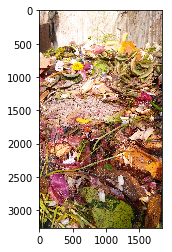

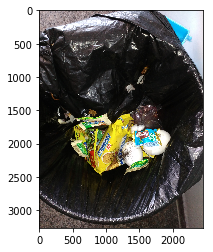

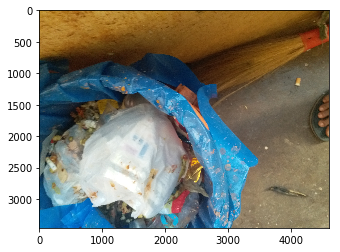

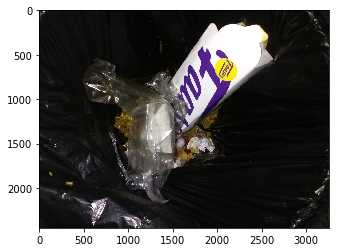

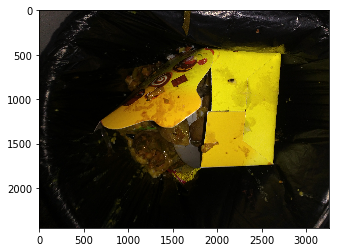

...

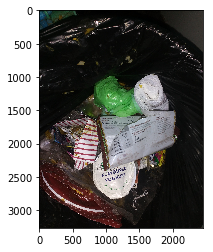

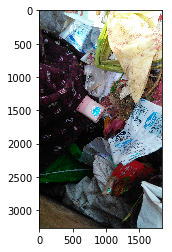

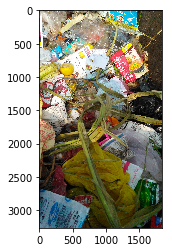

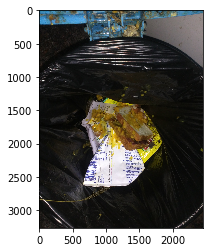

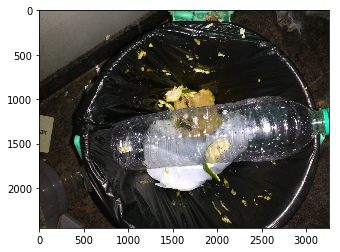

In [203]:
i=0
line_num=[]
while i<len(prediction):
    if binaryPredictionlabels[i]==1 and binarylabelsTest[i]==0:
        line_num.append(i)
    i=i+1
    
allFiles = os.listdir(featureVectorTestDirectory)       
i=0
FPImageHashes=[]

for line in allFiles:
        if i in line_num:
            line = line.strip('\n')
            FPImageHashes.append(line)
            #print(i,line)
        i=i+1

filepath="/opt/swm-ml-docker/images_bak/"
for i in FPImageHashes:
    s=filepath+i+".jpg"
    img=mpimg.imread(s)
    imgplot = plt.imshow(img)
    plt.show()

In [199]:
imageName=[]
for i in FPImageHashes:
    metadata=metadataByImageHash[i]
    imageName.append(metadata["Image Name"])
    

In [202]:
df = pd.read_csv('Consolidated.csv')
#data= df.loc[df['Image Name'].isin(imageName)]
data=df[df["Image Name"].isin(imageName) == True]
print len(data)
data.to_csv('FP_exp2.csv', sep='\t')

80
